In [1]:
import os
import sys
notebook_dir = os.getcwd()
project_root = os.path.abspath(os.path.join(notebook_dir, '..')) # Adjust as needed
if project_root not in sys.path:
    sys.path.append(project_root) # add notebook to sys.path

In [2]:
import matplotlib.pyplot as plt
import torch
import math
import numpy as np

from torch import nn
from torch.utils.data import TensorDataset, DataLoader, Subset
import torch
from torch import optim
from torch.nn import functional as F
from torch.nn.utils import clip_grad_norm_
from torch.optim import SGD, Adam

# Part 1: Synthetic dataset of scalar time-series data

In [3]:
def create_synthetic_data(num_points, time_scale=0.01, noise_scale=0.2):
    """Create a synthetic dataset of x(t) = sin(t) + noise(t)"""
    t = torch.arange(1, num_points+1)
    x = torch.sin(t * time_scale) + noise_scale * torch.randn(num_points)
    return t, x

def plot_timeseries(ts, xs):
    plt.figure(figsize=(6, 3))
    if not isinstance(ts, list):
        ts = [ts]
    if not isinstance(xs, list):
        xs = [xs]
    for t, x in zip(ts, xs):
        assert len(t) == len(x), "Time and data arrays must be of the same length"
        plt.plot(t.numpy(), x.numpy())
    plt.xlabel('time')
    plt.ylabel('x')
    plt.xlim([0, 1000])
    plt.grid(True)
    plt.show()

def create_dataset(x, num_train, train, tau):
    """Create a dataset from time-series with window length tau"""
    features = [x[i:i+tau] for i in range(len(x) - tau)]
    features = torch.stack(features, dim=0)
    targets = x[tau:].reshape(-1, 1)
    return features, targets


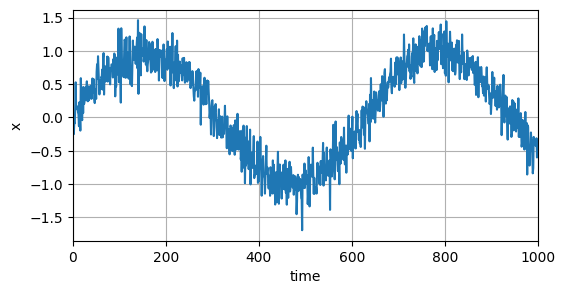

In [4]:
t, x = create_synthetic_data(num_points = 1000)
plot_timeseries(t, x)

In [5]:
class LinearRegression(nn.Module):
    def __init__(self, input_size, output_size):
        super(LinearRegression, self).__init__()
        self.linear = nn.Linear(input_size, output_size)

    def forward(self, x):
        return self.linear(x)

In [6]:
num_points = 1000
num_train = 600
tau = 4
t, x = create_synthetic_data(num_points=num_points)
features, targets = create_dataset(x, num_train, train=True, tau=tau)
dataset = TensorDataset(features, targets)
train_idx = range(0, num_train-tau)
train_ds = Subset(dataset, train_idx)
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
model = LinearRegression(tau, 1)

In [7]:
def fit(model, data):
    """Fit a model to the data using MSE loss and SGD optimizer"""
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01)
    
    for epoch in range(100):
        for X, y in data:
            optimizer.zero_grad()
            y_hat = model(X)
            loss = criterion(y_hat, y)
            loss.backward()
            optimizer.step()

In [8]:
fit(model, train_dl)

### 1.1: One-Step Prediction

In [9]:
with torch.no_grad():
    one_step_preds = model(features).squeeze()

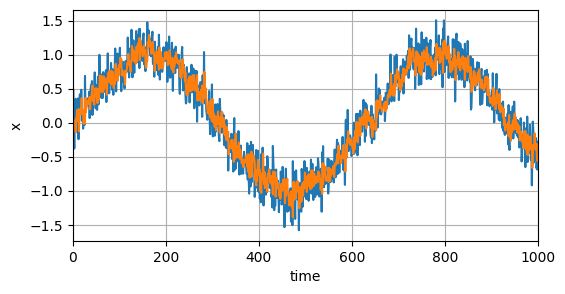

In [10]:
plot_timeseries([t, t[tau:]], [x, one_step_preds])

### 1.2: Autoregressive prediction

In [11]:
autoregressive_preds = torch.zeros(num_points)
autoregressive_preds[0:num_train] = x[0:num_train]
for j in range(num_train, num_points):
    autoregressive_preds[j] = model(autoregressive_preds[j-tau:j]).squeeze().detach()

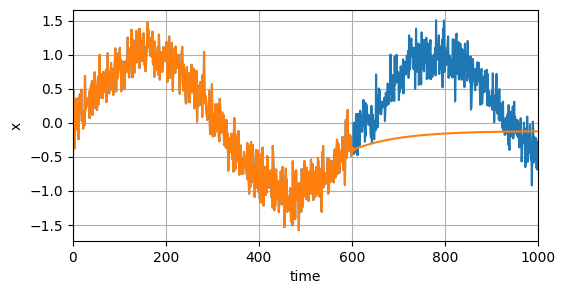

In [12]:
plot_timeseries([t, t], [x, autoregressive_preds])

# Part 2: Converting Raw Text Data into Sequence Data

### 2.1: Download dataset 

In this case, the dataset is H.G. Wells' The Time Machine.

In [13]:
from utils.data import download_time_machine

In [14]:
raw_text = download_time_machine()

In [15]:
raw_text[0:100]

'The Time Machine, by H. G. Wells [1898]\n\n\n\n\nI\n\n\nThe Time Traveller (for so it will be convenient to '

### 2.2: Use Regex to remove non-whitespace characters

This should be pretty straightforward, and goes in a function ```_preprocess```.

In [16]:
from utils.data import preprocess_tm

In [17]:
text = preprocess_tm(raw_text)

In [18]:
text[0:100]

'the time machine by h g wells i the time traveller for so it will be convenient to speak of him was '

### 2.3: Tokenization

Create a set of tokens from the dataset (corpus). Any new corpus should be able to be tokenized using the corpus.

In [19]:
from utils.data import tokenize_tm

In [20]:
tokens = tokenize_tm(text)

[print(token, end=',') for token in tokens[0:100]];

t,h,e, ,t,i,m,e, ,m,a,c,h,i,n,e, ,b,y, ,h, ,g, ,w,e,l,l,s, ,i, ,t,h,e, ,t,i,m,e, ,t,r,a,v,e,l,l,e,r, ,f,o,r, ,s,o, ,i,t, ,w,i,l,l, ,b,e, ,c,o,n,v,e,n,i,e,n,t, ,t,o, ,s,p,e,a,k, ,o,f, ,h,i,m, ,w,a,s, ,

### 2.4: Create Vocab from tokens

The vocab is the mapping from tokens to vectors, so that machine learning algorithms can process them. The vocabulary class should map from a character to an index, and back from an index to a character. 

The vocab class takes as input a list of tokens (or a list of lists of tokens). This will allow us to pass in different tokens (for example, a list of words or bigrams instead of characters) and create a vocab from them.

In [21]:
from utils.vocab import Vocab

In [22]:
vocab = Vocab(tokens)

### 2.5: Write a build method which takes raw text, creates a vocab, and creates a list of indexes representing the corpus

The build can be used with any vocab, and any raw text. It returns a list of indexes, and a vocab.

In [23]:
from utils.data import build_tm

In [24]:
corpus, vocab = build_tm(raw_text)

### 2.6: Exploratory statistics on the word counts, bigram and trigram counts from The Time Machine

Plot the frequency of words in the book, use log scale. Then plot the frequency of bigrams and trigrams.

In [25]:
words = preprocess_tm(raw_text).split(' ')
word_vocab = Vocab(words)
word_vocab.token_freqs[0:10]

[('the', 2261),
 ('i', 1267),
 ('and', 1245),
 ('of', 1155),
 ('a', 816),
 ('to', 695),
 ('was', 552),
 ('in', 541),
 ('that', 443),
 ('my', 440)]

In [26]:
freqs = [freq for token, freq in word_vocab.token_freqs]
print(len(freqs))

4580


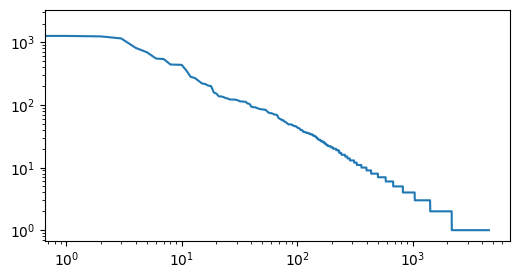

In [27]:
fig = plt.figure(figsize=(6, 3))
plt.loglog(freqs)
plt.show()

In [28]:
bigram_tokens = ['--'.join(pair) for pair in zip(words[:-1], words[1:])]
bigram_vocab = Vocab(bigram_tokens)
print(len(bigram_vocab))
bigram_freqs = [freq for token, freq in bigram_vocab.token_freqs]

trigram_tokens = ['--'.join(triple) for triple in zip(words[:-2], words[1:-1], words[2:])]
trigram_vocab = Vocab(trigram_tokens)
print(len(trigram_vocab))
trigram_freqs = [freq for token, freq in trigram_vocab.token_freqs]

20236
29884


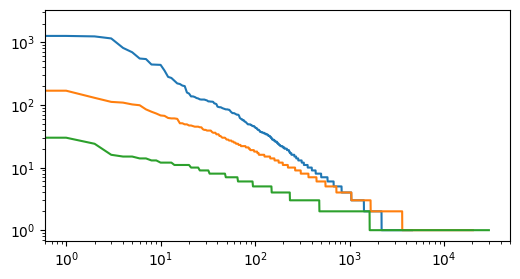

In [29]:
fig = plt.figure(figsize=(6,3))
plt.loglog(freqs)
plt.loglog(bigram_freqs)
plt.loglog(trigram_freqs)
plt.show()

# Part 3: Create TensorDataset and DataLoader for Character-level Language Model

We're going to create a TensorDataset from the corpus. Right now there is no validation set, only a training set. We'll perform validation by running ```predict()``` on the model and evaluating the model predictions.

In [30]:
from utils.data import get_data_tm

In [31]:
train_dl, val_dl, vocab = get_data_tm(10, 64)

for X, Y in train_dl:
    print(f"{X.shape=}, {Y.shape=}")
    break

X.shape=torch.Size([64, 10]), Y.shape=torch.Size([64, 10])


# Part 4: Create RNN Language Model

In [32]:
from utils.models import RNNLM

torch.Size([64, 10, 28])

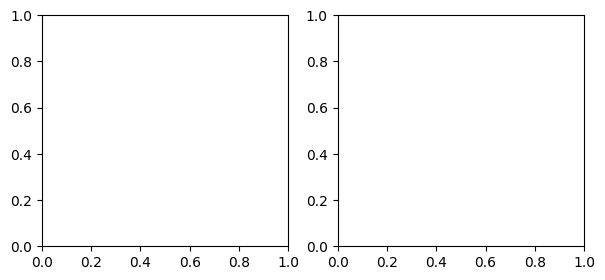

In [33]:
X, Y = next(iter(train_dl))
model = RNNLM(len(vocab), hidden_dim=64)
model(X).shape

# Part 5: Predict Language Model on Future Text

In [34]:
model.predict('it has', 20, vocab)

'it hasaagggggggggggggggggg'

# Part 6: Train RNN Language Model

In [ ]:
from utils.train import fit_rnn
from utils.losses import loss_fn_tm

In [36]:
device = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else "cpu"
print(f"Using {device} device")

Using mps device


In [ ]:
train_dl, val_dl, vocab = get_data_tm(num_steps=32, batch_size=1024)
model = RNNLM(len(vocab), hidden_dim=32)
optimizer = SGD(model.parameters(), lr=1.0)
model = fit_rnn(train_dl, val_dl, model, opt=optimizer,
                                    loss_fn=loss_fn_tm, num_epochs=100,
                                    id="Simple RNN Test",
                                    device=device)

In [39]:
model.to('cpu')
model.predict('it has', 20, vocab)

'it hasension and has satio'

# Part 7: Test Model Performance as Dataset Size Scales

In [40]:
def plot_stats(losses, val_losses, color='blue', axs=None, label="Train"):
    if axs is None:
        fig, axs = plt.subplots(figsize=(6,3))
    axs.plot(losses, label=label, color=color)
    axs.plot(val_losses, linestyle='--', color=color)
    axs.set_ylim(bottom=0)
    axs.legend()

In [41]:
def batch_loss(model, X, Y):
    logits = model(X)
    return loss_fn(logits, Y)

def train_step(opt, loss, model):
    loss.backward()
    clip_grad_norm_(model.parameters(), max_norm=1.0)
    opt.step()
    opt.zero_grad()

def validate_step(model, dataloader, opt, perplexities):
    loss = compute_stats(model, dataloader, opt)
    perplexities.append(math.exp(loss))

def train_epoch(model, dataloader, opt, perplexities):
    losses = 0.0

    model.train()
    for X, Y in dataloader:
        loss = batch_loss(model, X, Y)
        train_step(opt, loss, model)
        losses += loss.item()

    loss = losses / len(dataloader)
    perplexities.append(math.exp(loss))

def compute_stats(model, dataloader, opt):
    losses = 0.0

    model.eval()
    with torch.no_grad():
        for X, Y in dataloader:
            loss = batch_loss(model, X, Y)
            losses += loss.item()
    
    return losses / len(dataloader)

def fit(model, train_dl, val_dl, num_epochs=5, lr=1e-1, optimizer=SGD):
    opt = optimizer(model.parameters(), lr=lr)
    perplexities = []
    val_perplexities = []

    validate_step(model, val_dl, opt, val_perplexities)

    for epoch in range(num_epochs):
        print(f"epoch: {epoch+1}/{num_epochs}")
        train_epoch(model, train_dl, opt, perplexities)
        validate_step(model, val_dl, opt, val_perplexities)
    
    return model, perplexities, val_perplexities

In [42]:
sizes = (8, 18)

In [43]:
ds_sizes = [2**n for n in range(*sizes)]
print(ds_sizes)
print(len(text))

[256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072]
173428


In [44]:
batch_sizes = [min(2**n, 1024) for n in range(*sizes)]
print(batch_sizes)

[256, 512, 1024, 1024, 1024, 1024, 1024, 1024, 1024, 1024]


In [45]:
num_steps = 32
hidden_dim = 32
val_sizes = [min(2**(n-1), len(text) - 2**n - 2 * num_steps) for n in range(*sizes)]
print(val_sizes)

[128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 42292]


In [46]:
colors = list(iter(plt.cm.rainbow(np.linspace(0, 1, sizes[1] - sizes[0]))))
labels = [str(2**n) for n in range(*sizes)]
print(labels)

['256', '512', '1024', '2048', '4096', '8192', '16384', '32768', '65536', '131072']


In [47]:
def train(train_size, val_size, batch_size, num_epochs):
    train_dl, val_dl, vocab = get_data_tm(num_steps=32, batch_size=batch_size,
                                       num_train=train_size, num_val=val_size)
    model = RNNLM(len(vocab), hidden_dim=32)
    return fit(model, train_dl, val_dl, num_epochs=num_epochs, lr=1.0, optimizer=SGD)

epoch: 1/20
epoch: 2/20
epoch: 3/20
epoch: 4/20
epoch: 5/20
epoch: 6/20
epoch: 7/20
epoch: 8/20
epoch: 9/20
epoch: 10/20
epoch: 11/20
epoch: 12/20
epoch: 13/20
epoch: 14/20
epoch: 15/20
epoch: 16/20
epoch: 17/20
epoch: 18/20
epoch: 19/20
epoch: 20/20
Dataset size 256
Predict: it has                    
Final training loss: 15.538865031026326
Final validation loss: 16.836377614595726
epoch: 1/20
epoch: 2/20
epoch: 3/20
epoch: 4/20
epoch: 5/20
epoch: 6/20
epoch: 7/20
epoch: 8/20
epoch: 9/20
epoch: 10/20
epoch: 11/20
epoch: 12/20
epoch: 13/20
epoch: 14/20
epoch: 15/20
epoch: 16/20
epoch: 17/20
epoch: 18/20
epoch: 19/20
epoch: 20/20
Dataset size 512
Predict: it has                    
Final training loss: 15.70822163119358
Final validation loss: 16.457146035369686
epoch: 1/20
epoch: 2/20
epoch: 3/20
epoch: 4/20
epoch: 5/20
epoch: 6/20
epoch: 7/20
epoch: 8/20
epoch: 9/20
epoch: 10/20
epoch: 11/20
epoch: 12/20
epoch: 13/20
epoch: 14/20
epoch: 15/20
epoch: 16/20
epoch: 17/20
epoch: 18/20
epoc

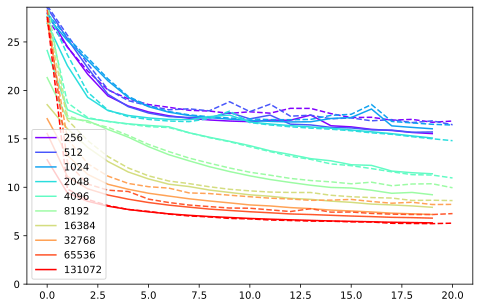

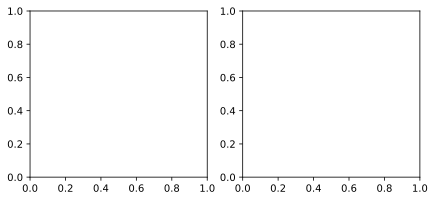

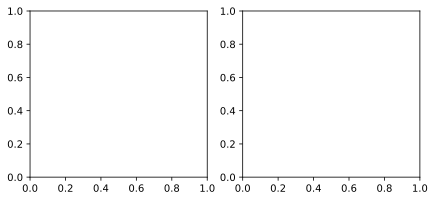

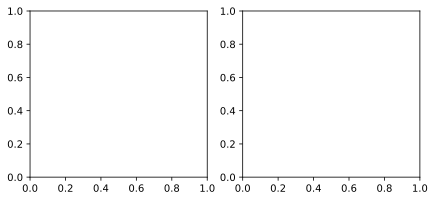

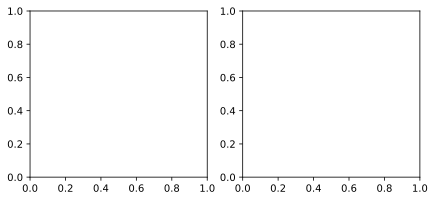

...

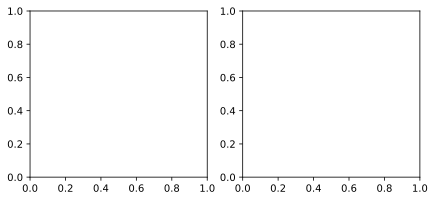

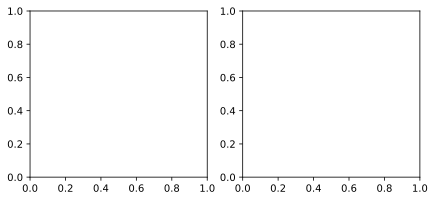

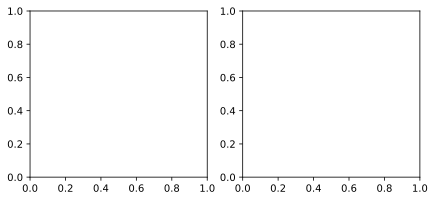

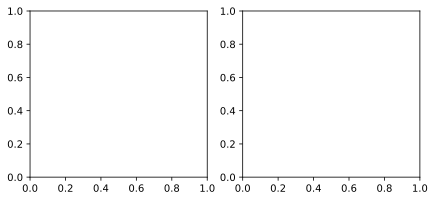

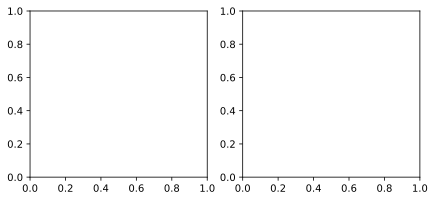

In [48]:
num_epochs = 20
vocab = Vocab(tokenize_tm(preprocess_tm(download_time_machine())))

fig, axs = plt.subplots(figsize=(8,5))

for train_size, val_size, batch_size, color, label in zip(
        ds_sizes, val_sizes, batch_sizes, colors, labels):

    model, losses, val_losses = train(train_size, val_size, batch_size, num_epochs)
    
    print(f"Dataset size {label}")
    print(f"Predict: {model.predict('it has', 20, vocab)}")
    print(f"Final training loss: {losses[-1]}")
    print(f"Final validation loss: {val_losses[-1]}")

    plot_stats(losses, val_losses, color=color, axs=axs, label=label)

plt.show()